<center><h2 align="center">Tree Crown Extraction from Aerial Imagery using Conditional Generative Adversarial Network (cGAN)</h2></center>


### Pre-Requisites :
 - GPU     
 - Python3
 - Anaconda Distribution
 - TensorFlow
 - Keras

### Specifications :
<pre>
<b>GPU</b> : Nvidia GeForce RTX 2080 Ti
<b>TensorFlow</b> : v2.0.0-beta
<b>Dataset</b> : Mangos Dataset
     Train Data : 5100 images
     Test Data : 1260 images
<b>Dataset dimensions</b> :
     Train Data : 480 x 240 x 3
     Test Data : 480 x 240 x 3
<b></b>
</pre>

### Architecture : 
<pre>
<img src="./nb_images/cgan.png" alt="Architecure_of_CGAN" float="right"/>
</pre>

<br><br><br>

### Importing Libraries

<p><b>Tensorflow</b> : An open source library for numerical computation using data flow graphs (which is all that a Neural Network really is).<br>
    <b>Keras</b> : Keras is a minimalist, modular neural network library that can use either Theano or TensorFlow as a backend.<br>
    <b>Numpy</b> : An open source and a package in Python used for Scientific Computing with very good accuracy and in very less time.<br> 
    <b>Pandas</b> : An open source and a library providing high-performance, easy-to-use data structures and data analysis tools.<br>
    <b>Matplotlib</b> : A plotting library used for 2D and 3D graphics as well as animations in python.<br>
    <b>Scikit-learn</b> : Open-Source, Simple and efficient tools for data mining and data analysis. Built on NumPy, SciPy, and matplotlib.<br>
    <b>Scikit-image</b> : A collection of algorithms for image processing and computer vision.</p>

In [16]:
#!pip install tensorflow-gpu==2.0.0-beta1
import tensorflow as tf

import os
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from sklearn.metrics import confusion_matrix, classification_report
from skimage.color import rgb2gray

<p><br><br></p>

### Setting Global Variables

<p>
    <b>BUFFER_SIZE</b> : A Batch of samples is loaded and a sample will be picked at random for randomizing the data.<br>
    <b>IMG_WIDTH, IMG_HEIGHT</b> : These are the dimensions of an image. For a 256x256x3 picture, image heigth and width will be 256 and 256.<br>
    <b>LAMDA</b> : A regularization factor, used in calculating loss.<br>
    <b>OUTPUT_CHANNELS</b> : No. of channels, we'll be required at the last as the output.<br>
    <b>BATCH_SIZE</b> : We train our model using mini-batch method which is very efficient. So BATCH_SIZE is the no. of images taken as a single batch.<br>
    <b>EPOCHS</b> : Epochs refer to how many times your input will be used to update the weights while training the model.<br>
    <b>PATH</b> : This is the data path given to our model to load the data.
</p>

In [17]:
BUFFER_SIZE = 400
IMG_WIDTH = 256
IMG_HEIGHT = 256
LAMBDA = 100
OUTPUT_CHANNELS = 3

BATCH_SIZE = 16
EPOCHS = 10


PATH = './mangos/'

<br><br>

### Loading the Data
<p> We'll load all the images and convert them as matrices. After that we'll do the data preprocessing and return the processed data.</p>

In [18]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, w:, :]
  input_image = image[:, :w, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

<br><br>

### Data Preprocessing

<p>
    <b>Resize</b> : To resize all the data to our required size since our model allows only single sized data. In this case, it is 261x261x3.<br>
    <b>Random Crop</b> : To cut the image randomly to our required size. Here we cut the image from 261x261x3 to 256x256x3.<br>
    <b>Normalize</b> : Using thi function, we will convert all the values (0..255) to (-1..1). This will make our training and computations much faster.<br>
    <b>Random Jitter</b> : Contains Resize, Random crop and Flipping the image.<br>
</p>

In [19]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 261 x 261 x 3
  input_image, real_image = resize(input_image, real_image, IMG_HEIGHT+5, IMG_WIDTH+5)

  # randomly cropping to 240 x 240 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

<br><br>

### Our Input and Target images

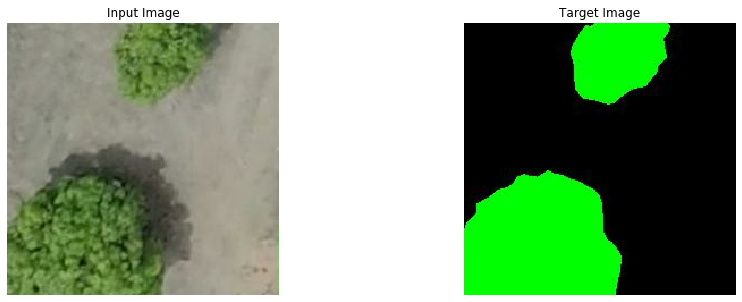

In [20]:
inp, re = load(PATH+'merged/train/32.jpg')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(inp/255.0)
plt.title('Input Image')
plt.axis('off')
plt.subplot(122)
#plt.figure(figsize=(15,5))
plt.imshow(re/255.0)
plt.title('Target Image')
plt.axis('off')
plt.show()

<br><br>

### Loading the Train and Test data and Making them as mini-batches.

In [21]:
train_dataset = tf.data.Dataset.list_files(PATH+'merged/train/*.jpg')
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.map(load_image_train,num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)



test_dataset = tf.data.Dataset.list_files(PATH+'merged/test_1007/*.jpg')
test_dataset = test_dataset.shuffle(BUFFER_SIZE)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)#BATCH_SIZE)

<br><br>

### Creating our Model

### 1. Functions used in the model.

<p>
    <b>Downsample</b> : This will downsample the input by 2. It will do: Convolution -> Batch Normalization -> Activation.<br>
    <b>Upsample</b> : This will upsample the input by 2. It will do: De-Convolution -> Batch Normalization -> Drop-Out -> Activation.<br>
    <b>Conv</b> : This will perform the simple convolution on the input. It will do: Convolution -> Batch Normalization -> Activation.
</p>

In [22]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

def conv(filters,size,apply_batchnorm=True):
  
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=1, padding='same',
                             kernel_initializer=initializer, use_bias=False, data_format = 'channels_last'))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

<br><br>

### 2. Stacking the Layers for model.

For our cGAN, we need two models, one is the Generator and the other one is the Discriminator.

#### We've 2 generator models here : i) U-Net ii) ResNet

### ResNet Generator

<img src="./nb_images/resnet_.jpg"/>

In [23]:
def residual_block(feature, dropout=False):
    x = tf.keras.layers.Conv2D(128, kernel_size=3, strides=1, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(
        mean=0.0, stddev=0.02), use_bias=False)(feature)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    if dropout:
        x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Conv2D(128, kernel_size=3, strides=1, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(
        mean=0.0, stddev=0.02), use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    return tf.keras.layers.Add()([feature, x])



def resnet_generator(n_block=3):
    # input
    input = tf.keras.layers.Input(shape=(256, 256, 3))
    x = tf.keras.layers.Conv2D(32, kernel_size=3, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(
        mean=0.0, stddev=0.02), use_bias=False)(input)  # use reflection padding instead
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    # downsample
    x = tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(
        mean=0.0, stddev=0.02), use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    # downsample
    x = tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(
        mean=0.0, stddev=0.02), use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    # Residual
    for i in range(n_block):
        x = residual_block(x,dropout=True)
    # upsample
    x = tf.keras.layers.Conv2DTranspose(64, kernel_size=3, strides=2, padding='same',
                        kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    # upsample
    x = tf.keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(
        mean=0.0, stddev=0.02), use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    # output
    x = tf.keras.layers.Conv2D(3, kernel_size=3, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(
        mean=0.0, stddev=0.02), use_bias=False)(x)  # use reflection padding instead
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('tanh')(x)
    generator = tf.keras.Model(inputs=input, outputs=x)
    return generator

### U-Net Generator

<img src="./nb_images/unet.jpg"/>

In [24]:
def unet_generator():
  down_stack = [
    downsample(64, 4, apply_batchnorm=False),
    downsample(128, 4),
    downsample(256, 4), 
    downsample(512, 4),
    downsample(512, 4), 
    downsample(512, 4), 
    downsample(512, 4),
    downsample(512, 4),
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4),
    upsample(256, 4),
    upsample(128, 4),
    upsample(64, 4),
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')

  concat = tf.keras.layers.Concatenate()

  inputs = tf.keras.layers.Input(shape=[None,None,3])
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = concat([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

<br><br>

### Discriminator Network

<img src="./nb_images/discriminator.jpg" width="60%"/>

In [25]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])

  down1 = downsample(64, 4, False)(x)
  down2 = downsample(128, 4)(down1)
  down3 = downsample(256, 4)(down2)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) 

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

<br><br>

### Loss Calculations :

<center><h4>Binary Cross-Entropy</h4></center>
<img src='./nb_images/binary_crossentropy.png'/><br>
<center><h4>L1 Loss</h4></center>
<img src='./nb_images/l1loss.gif'/><br><br>
<b>Discriminator Loss</b> : We'll calculate discrimiator loss by taking the BinaryCrossEntroy(BCE) for the real and the fake images.<br><br>
<b>Generator Loss</b> : For the generator also, we'll calculate BCE but in addition we'll add L1 loss too. This will gives the better results than the BCE alone.
<br><br><br>
<table width='50%'>
    <tr>
        <th>Loss</th>
        <th>L1</th>
        <th>cGAN</th>
        <th>L1 + cGAN</th>
    </tr>
    <tr>
        <td>Per-pixel acc.</td>
        <td>0.86</td>
        <td>0.74</td>
        <td>0.83</td>
    </tr>
    <tr>
        <td>Per-class acc.</td>
        <td>0.42</td>
        <td>0.28</td>
        <td>0.36</td>
    </tr>
</table>

In [26]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss

<br><br>

### Initializing the both Generator and Discriminator.

 Here we can swich between the different generators along with checkpoint directories.

In [35]:
#default : unet_generator

use_resnet = False

if use_resnet:
    generator = resnet_generator(12)
    checkpoint_dir = './training_checkpoints_m/resnet'
else:
    generator = unet_generator()
    checkpoint_dir = './training_checkpoints_m'

discriminator = Discriminator()

<br><br>

### Initializing Optimizers.
Here we've used Adam optimizer which shows the best results among the other optimizers.

In [36]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

<br><br>

### Creating the Checkpoints.
Using these checkpoints, we can store all the variables and weights of models as a checkpoint file.<br>
Indeed we can resume our trianing by restoring the latest checkpoint saved.

In [37]:
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

<br><br>

### Training Part

<b>train :</b> In this function, Preprocessed data will be loaded and that will be given to the models using train_step function. And losses returned by the train_step function will be written into a text file for the further observations.

<b>train_step :</b> This function takes the real image and condition as inputs and apply them to the generator and discrimator models. At last it'll calculate graidents and losses for the optimizers to optimize the model for every epoch.

<b> generate_images </b>: This function will take trained generator model and real images. And it will return predictions on those images and save them into respective directories.

In [38]:
def generate_images(model, test_input, tar,count,opt='train'):
  prediction = model(test_input, training=True)
  plt.imsave('./result/cm/real/real%d.jpg'%count,np.array(tar[0])* 0.5 + 0.5)
  plt.imsave('./result/cm/pred/pred%d.jpg'%count,np.array(prediction[0])* 0.5 + 0.5)
  plt.figure(figsize=(15,8))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  if(opt=='test'):
    plt.savefig('./result/test/epoch%d.png'%count)
  plt.savefig('./result/epoch%d.png'%count)
  plt.show()

@tf.function
def train_step(input_image, target):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    #print('Training Generator....')
    gen_output = generator(input_image, training=True)
    #print('Training Discriminator....')
    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)
    #print('Calculating Losses....')
    gen_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
  
  generator_gradients = gen_tape.gradient(gen_loss,generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,discriminator.trainable_variables))
  
  return gen_loss,disc_loss

optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001)

def train(dataset, epochs):
  losses = []
  open('loss.txt', 'w').close()
  file = open('loss.txt','a')
  file.write('Generator_loss,Discriminator_loss\n')
  count = 1
  for epoch in range(epochs):
    start = time.time()

    for input_image, target in dataset:
      gl,dl = train_step(input_image, target)
      gl,dl=float(gl),float(dl)
      file.write(str(gl)+','+str(dl)+'\n')
      losses.append([gl,dl])
    print('Losses are writing into the file.....')
    clear_output(wait=True)
    for inp, tar in test_dataset.take(1):
      generate_images(generator, inp, tar,count)
      count+=1

    # saving (checkpoint) the model every 5 epochs
    chkpnt_step = 2
    if (epoch + 1) % chkpnt_step == 0:
      print('Checkpoint : Saved')
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))
    print('Losses :\n Generator loss: %.4f\n Discriminator loss:%.4f'%(gl,dl))
  file.close()
  return losses


Using the function <b>'train'</b> we'll train our model and it'll take the preprocessed data and the no. of epochs. After the trainining is done, it'll reflect losses for every epoch. For Every epoch, time spent for that epoch and the losses will be shown.

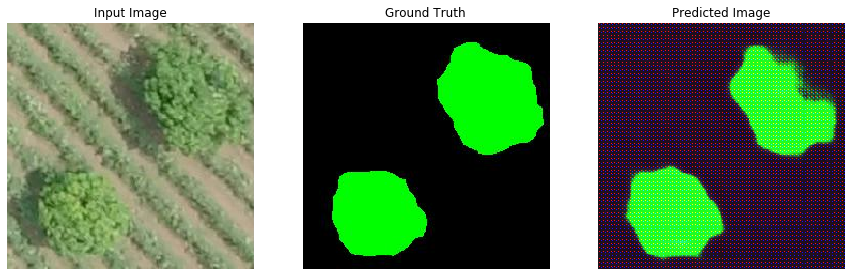

Checkpoint : Saved
Time taken for epoch 10 is 101.8487560749054 sec

Losses :
 Generator loss: 41.1816
 Discriminator loss:0.0002


In [95]:
losses = train(train_dataset, 10)

<br><br>

#### Listing the saved Checkpoints.

In [39]:
!ls {checkpoint_dir}

035005072019  ckpt-4.data-00000-of-00002  ckpt-5.data-00000-of-00002  resnet
092506072019  ckpt-4.data-00001-of-00002  ckpt-5.data-00001-of-00002  ufcn
checkpoint    ckpt-4.index		  ckpt-5.index


#### Restoring the latest checkpoint to use it for the testing

In [40]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
#checkpoint.restore('./training_checkpoints_m/ckpt-4')

<br><br>

### Testing Part

we'll use the same 'generate_images' function which is used in the training but we'll pass the argument 'test' to tell that we are testing now. Then it'll test on the test dataset and save the results in respective directories.

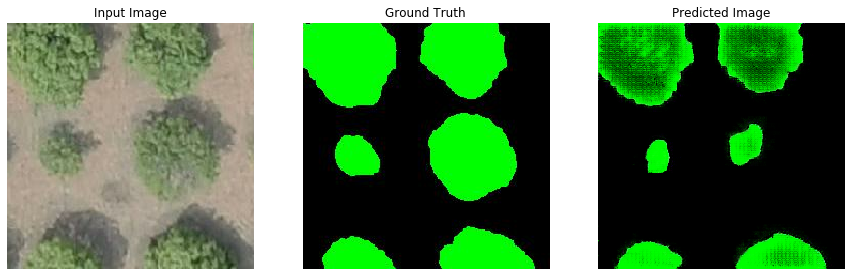

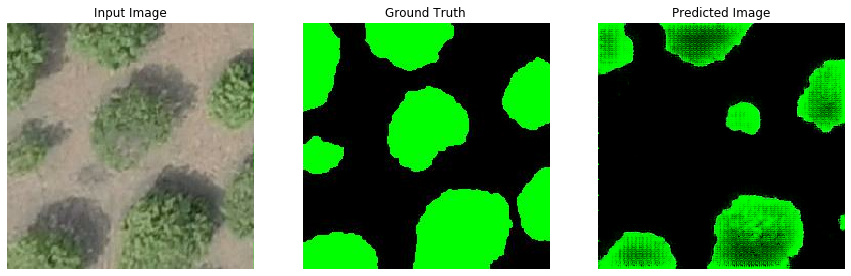

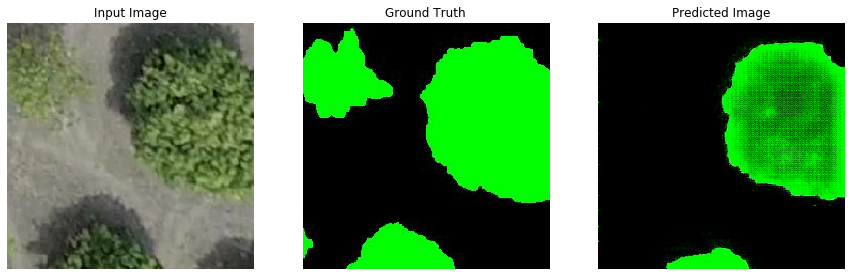

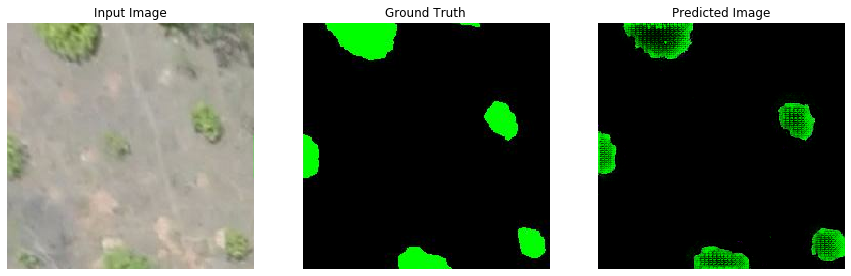

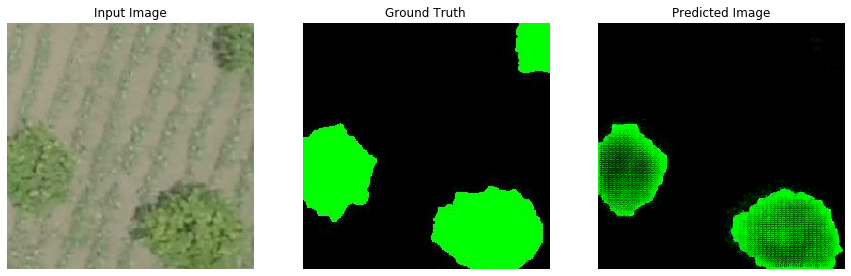

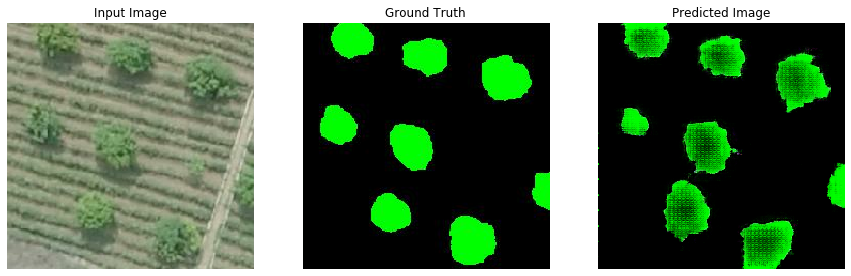

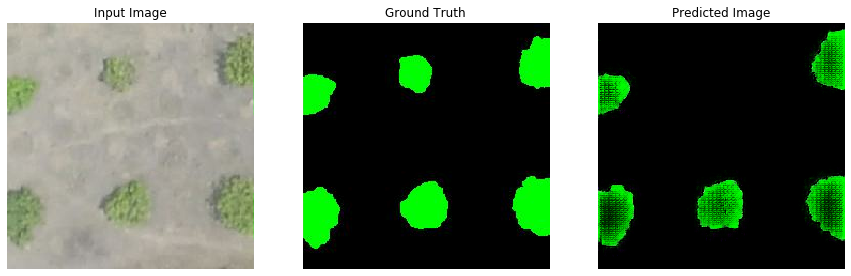

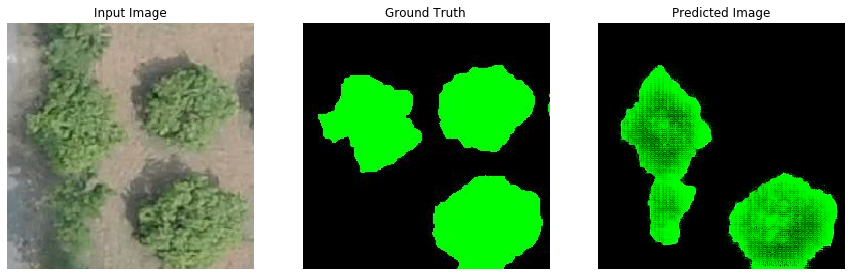

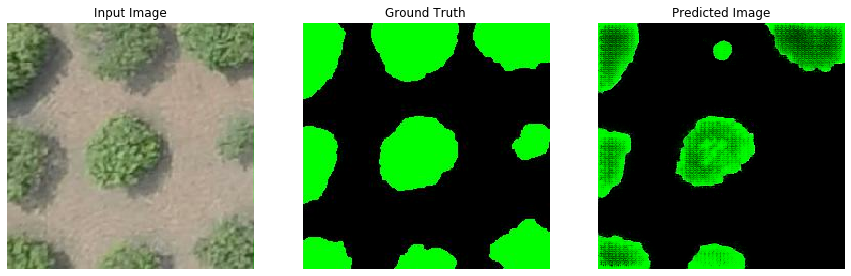

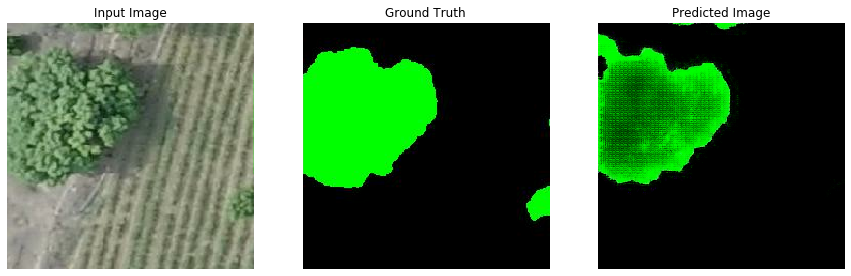

In [41]:
count=0
for inp, tar in test_dataset.take(10):
  generate_images(generator, inp, tar,count,'test')
  count+=1

<br><br>

### Testing on the random image from the internet.

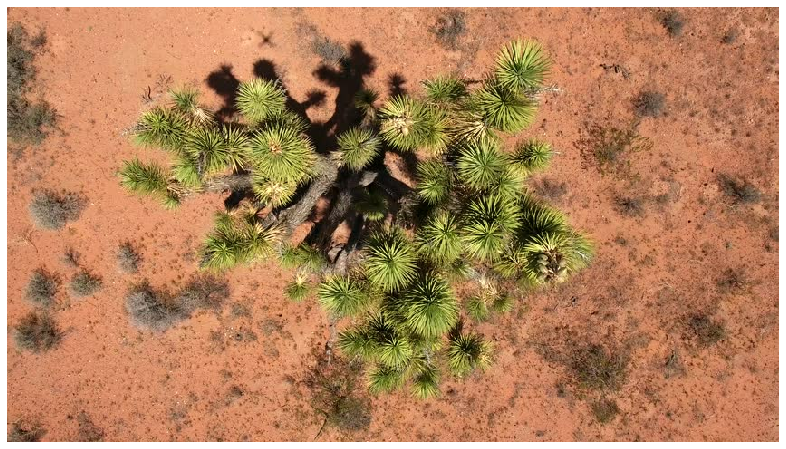

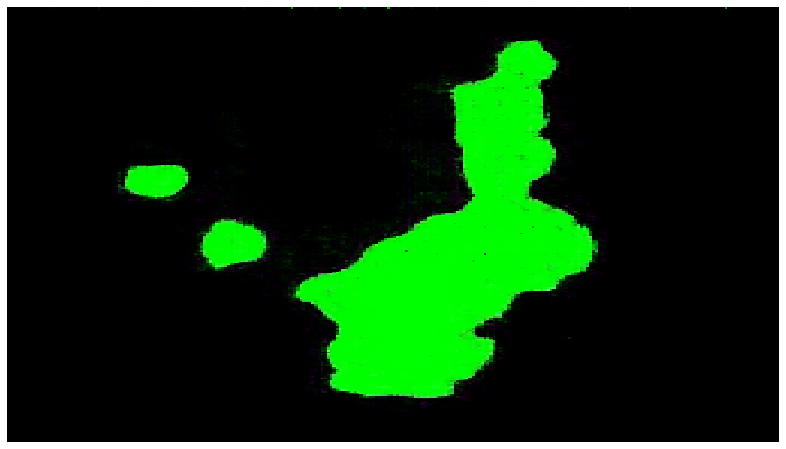

In [86]:
img_path='mtest0.jpg'
img = tf.io.read_file(img_path)
img = tf.image.decode_jpeg(img)
plt.figure(figsize=(15,8))
plt.imshow(img)
plt.axis('off')
plt.show()

keep = img.shape
img = tf.cast(img, tf.float32)
img,img=resize(img,img, 256, 256)
img,img=normalize(img,img)
img= img[np.newaxis,:,:,:]
pred = generator(img, training=True)

#pred = np.array((pred[0]+1)*127.5,dtype=int)
pred,pred=resize(pred,pred, keep[0], keep[1])
plt.figure(figsize=(15,8))
plt.imshow(pred[0]*0.5+0.5)
plt.axis('off')
plt.show()

<br><br>

### Getting the Feature-Maps.
Feature-Maps are the ones who tell us what's heppening between the layers that stacked up in the model.<br>
We'll use the trained generator and for every layer, we'll take the output and store them in the respective directory.

layer1_activation.shape :  (1, 256, 256, 3)
layer2_activation.shape :  (1, 128, 128, 64)
layer3_activation.shape :  (1, 64, 64, 128)
layer4_activation.shape :  (1, 32, 32, 256)
layer5_activation.shape :  (1, 16, 16, 512)
layer6_activation.shape :  (1, 8, 8, 512)
layer7_activation.shape :  (1, 4, 4, 512)
layer8_activation.shape :  (1, 2, 2, 512)
layer9_activation.shape :  (1, 1, 1, 512)


/home/sno/anaconda3/envs/gpugan/lib/python3.7/site-packages/matplotlib/image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
/home/sno/anaconda3/envs/gpugan/lib/python3.7/site-packages/matplotlib/image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
/home/sno/anaconda3/envs/gpugan/lib/python3.7/site-packages/matplotlib/image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/home/sno/anaconda3/envs/gpugan/lib/python3.7/site-packages/matplotlib/image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
/home/sno/anaconda3/envs/gpugan/lib/python3.7/site-packages/matplotlib/colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
/home/sno/anaconda3/envs/gpugan/lib/python3.7/site-packages/numpy/ma/core.py:713: UserWarning: Warning: converting a masked

layer10_activation.shape :  (1, 2, 2, 512)
layer11_activation.shape :  (1, 2, 2, 1024)
layer12_activation.shape :  (1, 4, 4, 512)
layer13_activation.shape :  (1, 8, 8, 512)
layer14_activation.shape :  (1, 16, 16, 512)
layer15_activation.shape :  (1, 32, 32, 256)
layer16_activation.shape :  (1, 64, 64, 128)
layer17_activation.shape :  (1, 128, 128, 64)
layer18_activation.shape :  (1, 256, 256, 3)


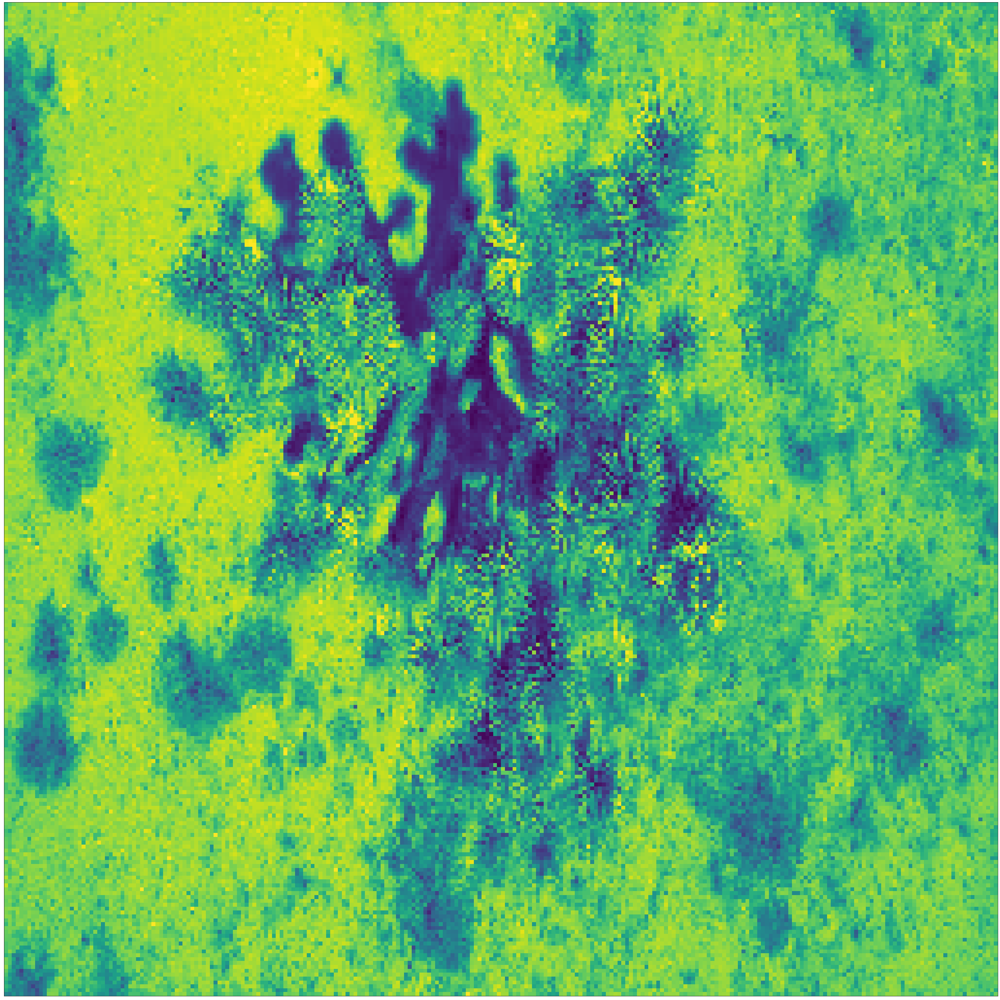

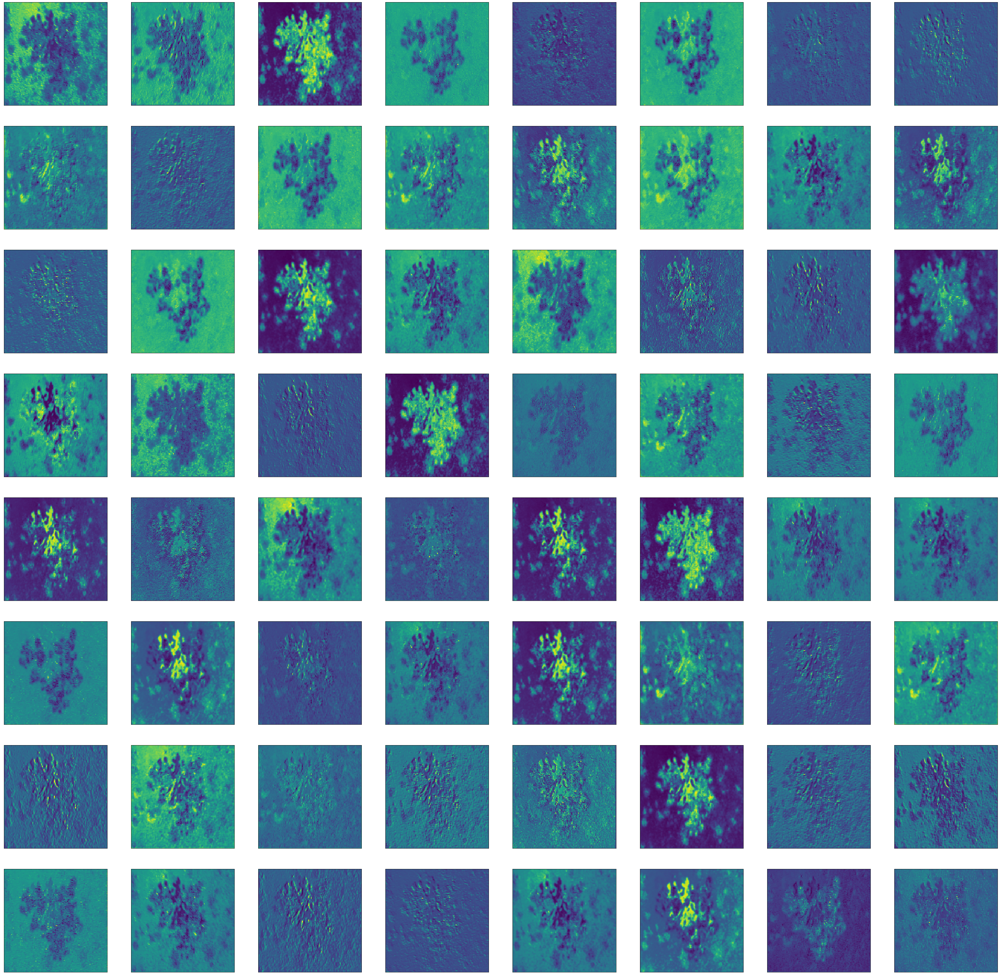

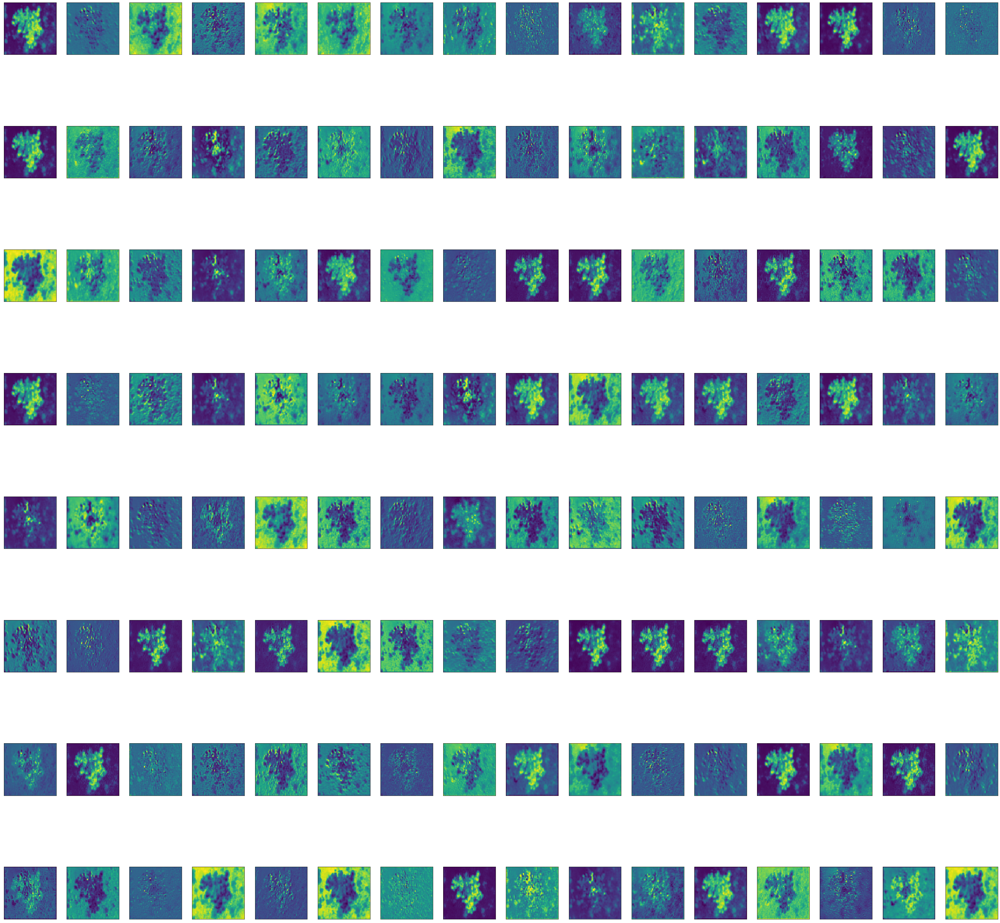

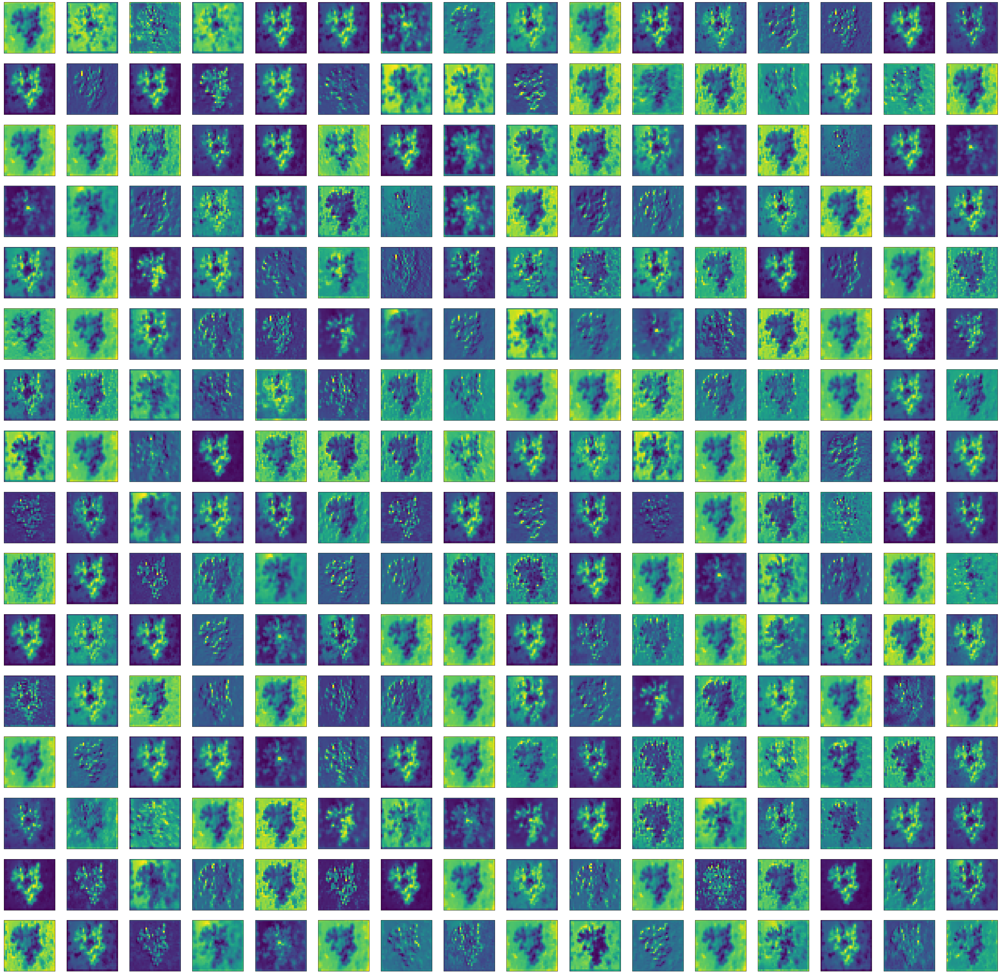

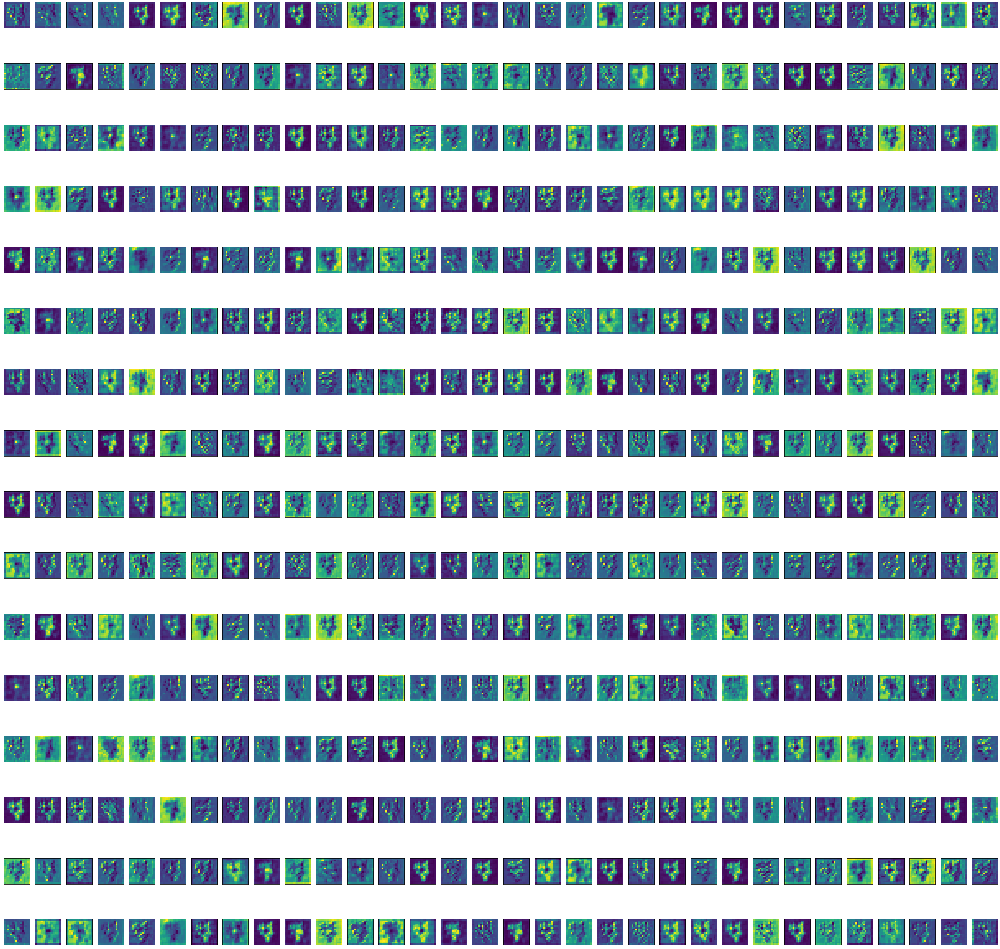

...

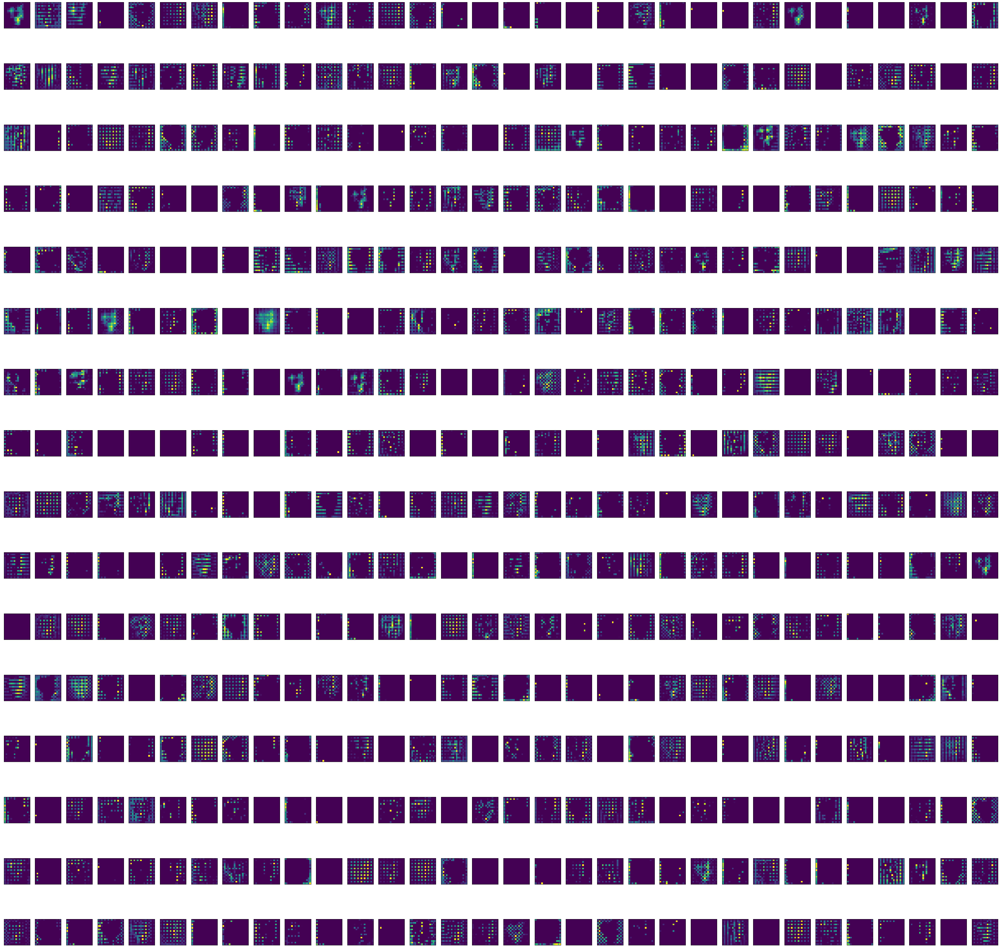

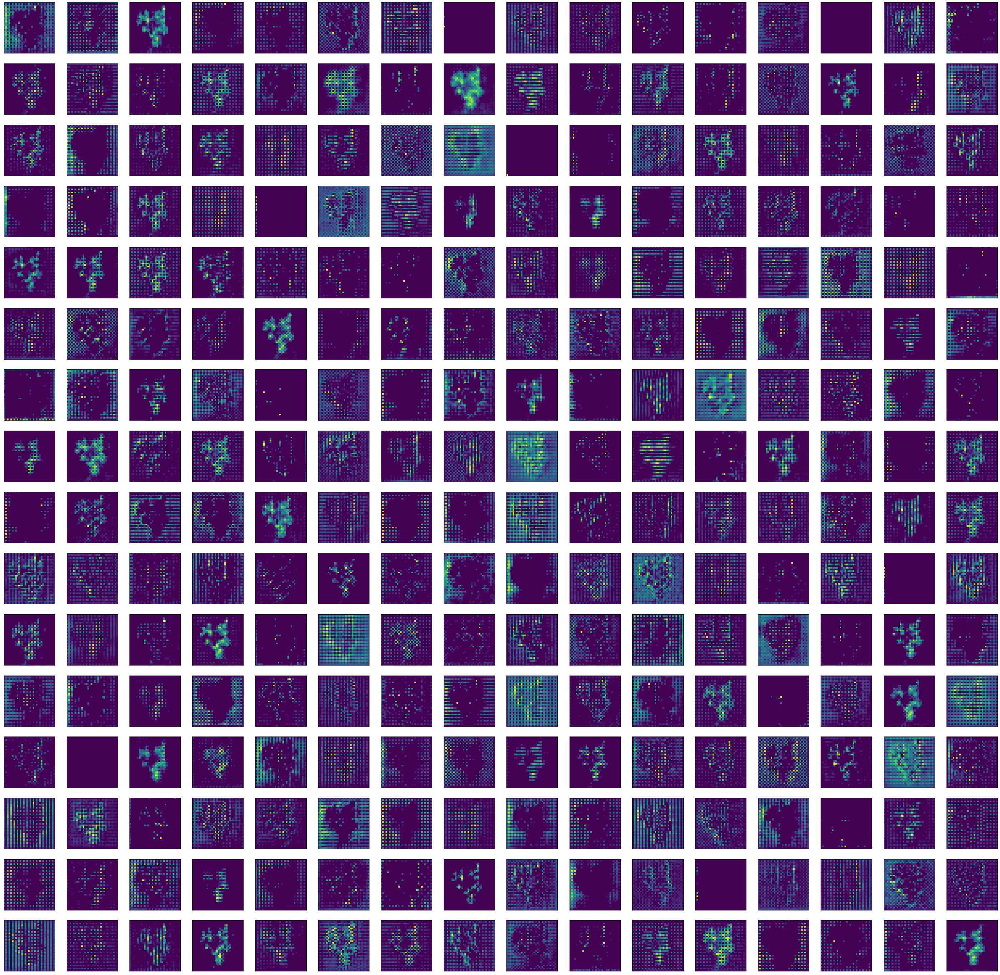

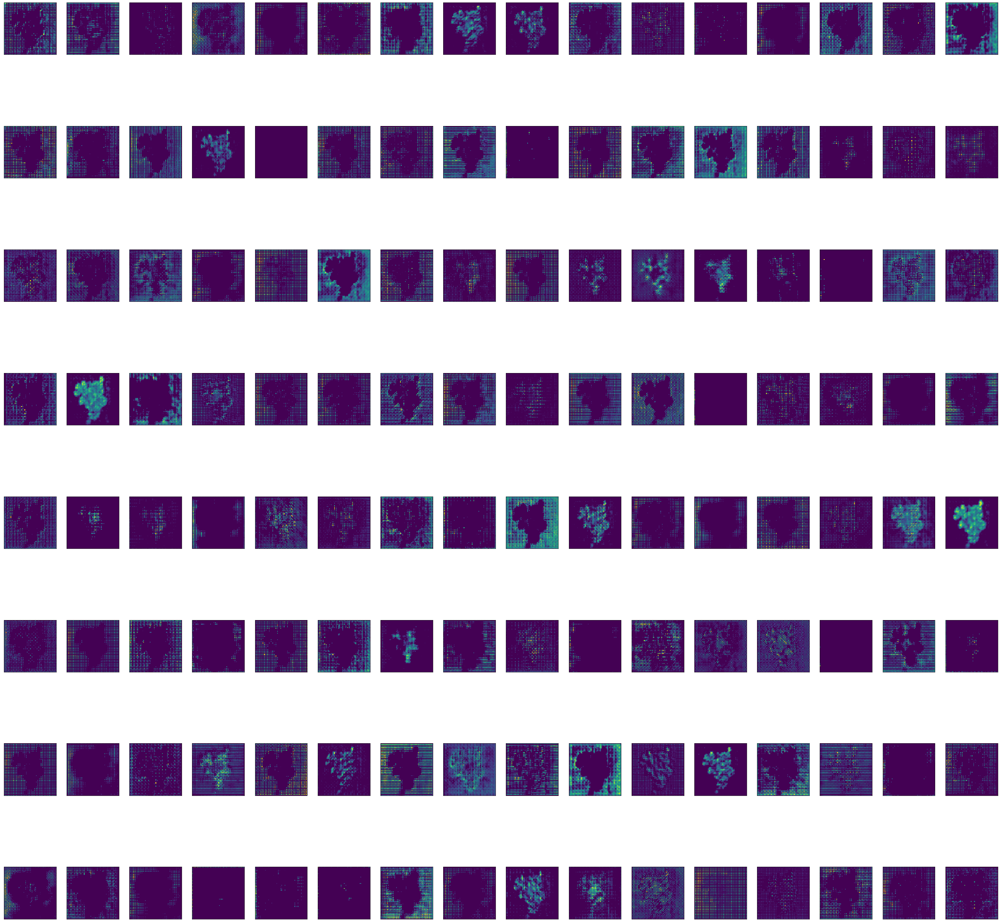

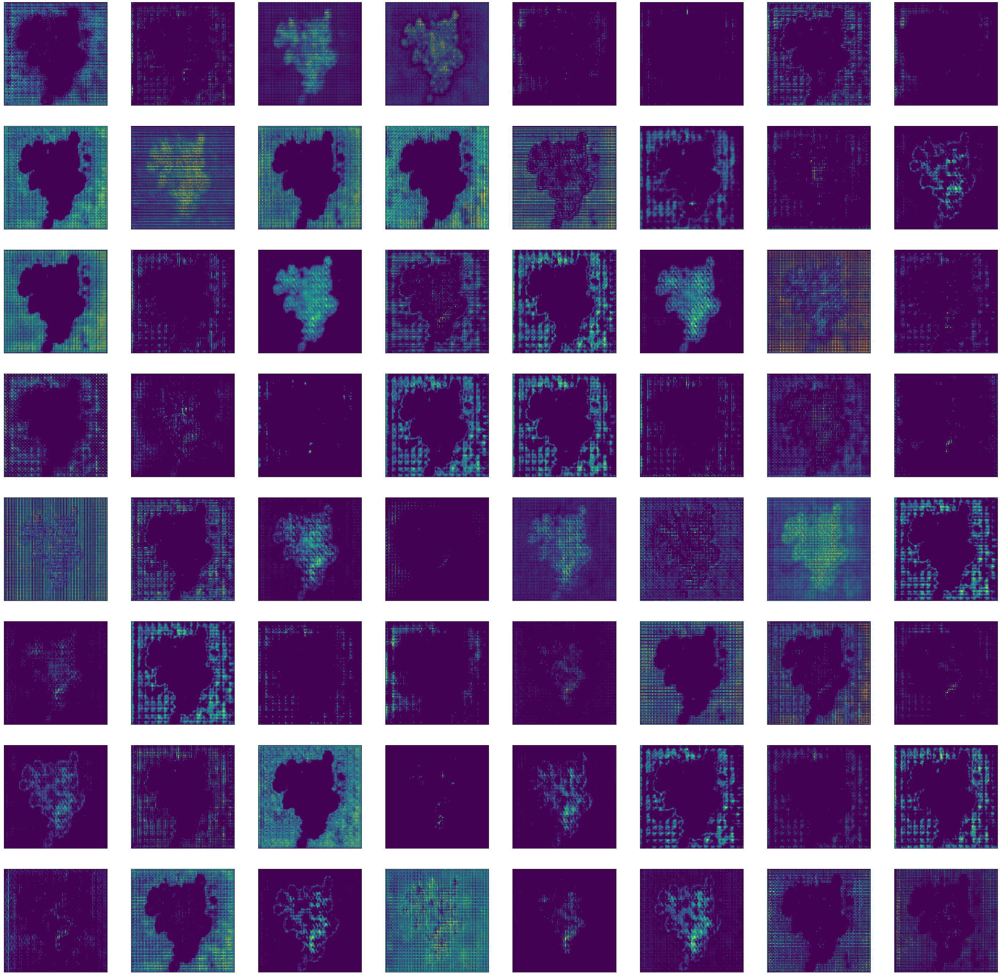

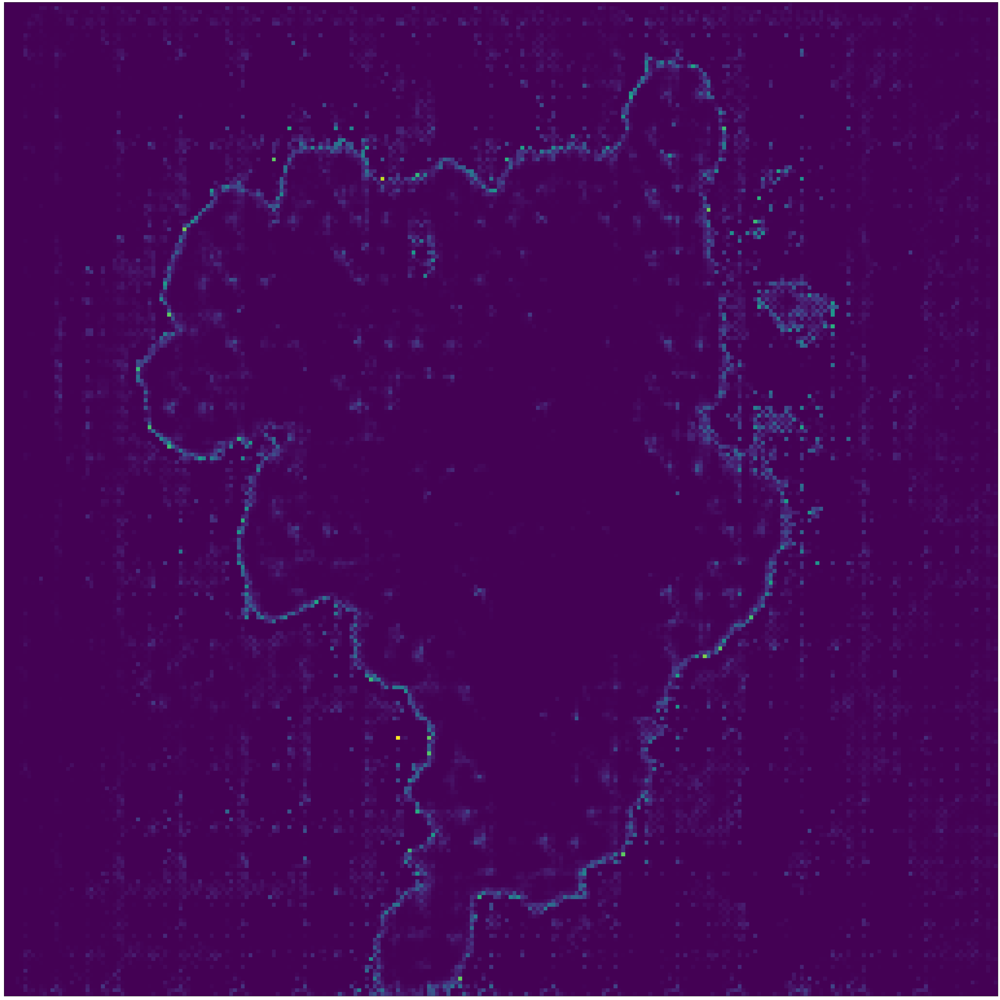

In [87]:
layer_outputs = [layer.output for layer in generator.layers] 
activation_model = tf.keras.Model(inputs=generator.input, outputs=layer_outputs)
d = {1024:(32,32),512:(16,32),256:(16,16),128:(8,16),64:(8,8),32:(4,8),16:(4,4),8:(2,4),4:(2,2),2:(1,2),1:(1,1),3:(1,1)}
activations = activation_model.predict(img)
c=1
for act in activations:
    exec('layer%d_activation = act'%c)
    sh = eval('layer%d_activation.shape'%c)
    nf = sh[-1]
    if(nf==3):nf=1
    print('layer%d_activation.shape : '%c,sh)
    plt.figure(figsize=(50,50))
    for i in range(nf):
        exec('ax = plt.subplot(%d,%d,%d)'%(d[nf]+(i+1,)))
        plt.imshow(eval('layer%d_activation[0, :, :, %d]'%(c,i)))
        ax.set_xticks([])
        ax.set_yticks([])
    plt.savefig('./result/feature_maps/matrix_layer%d_activations'%c+'.jpg')
    c+=1

<br><br>

### Getting the Metrics
We'll calculate the confusion matrix with the real and predicted results.<br>
From that we'll calculate other metrics such as Accuracy, Precision, Recall and F1-Score.<br>




In [106]:
cm_path = './result/cm/'

def get_cmat(pred_img,real_img):
    y_pred = np.array(rgb2gray(plt.imread(pred_img)))
    y_real = np.array(rgb2gray(plt.imread(real_img)))
    y_pred[y_pred > 0.5] = 1
    y_real[y_real > 0.5] = 1
    y_pred = np.array(y_pred,dtype=int).flatten()
    y_real = np.array(y_real,dtype=int).flatten()
    cnf_matrix = confusion_matrix(y_real, y_pred)
    return cnf_matrix

def get_metrics(normalize = False):
    no_of_test_imgs = len(os.listdir(cm_path+'pred/'))
    
    if(len(os.listdir(cm_path+'pred/'))!=len(os.listdir(cm_path+'real/'))):raise ValueError('No. of Predicted images and No. of Real images are not equal.')
    
    params = ['TP', 'FN', 'FP', 'TN','Accuracy','Precision','Recall','F1_score']
    dict_cm = {param:[] for param in params}
    
    for _ in range(no_of_test_imgs):
        y_pred = cm_path+'pred/pred%d.jpg'%_
        y_real = cm_path+'real/real%d.jpg'%_
        cmat = get_cmat(y_real, y_pred)
        
        if(normalize == True):
            TP,FN,FP,TN = (cmat[0,0],cmat[0,1],cmat[1,0],cmat[1,1])/np.sum(np.sum(cmat))
        else:
            TP,FN,FP,TN = cmat[0,0],cmat[0,1],cmat[1,0],cmat[1,1]
        
        Accuracy = (TP+TN)/(TP+TN+FP+FN)
        Precision = TP/(TP+FP)
        Recall = TP/(TP+FN)
        F1_score = 2*((Precision*Recall)/(Precision+Recall))
        
        for param in params:
            dict_cm[param].append(eval(param))

    df_cm = pd.DataFrame(dict_cm)
    df_cm.index = ['test_img_%d'%(i+1) for i in range(no_of_test_imgs)]
    return df_cm

<br>

### Metrics taken on the basis of no. of pixels :

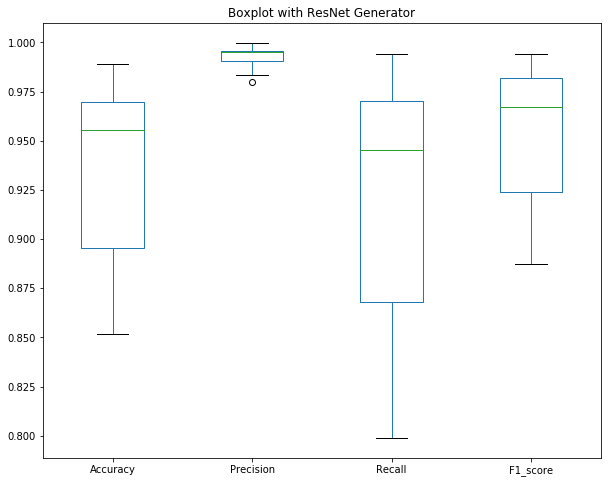

,TP,FN,FP,TN,Accuracy,Precision,Recall,F1_score
test_img_1,0.856216,0.031677,0.004196,0.107910,0.964127,0.995123,0.964323,0.979481
test_img_2,0.583603,0.143250,0.001328,0.271820,0.855423,0.997730,0.802918,0.889786
test_img_3,0.767029,0.017075,0.003937,0.211960,0.978989,0.994894,0.978224,0.986488
test_img_4,0.912918,0.005554,0.005280,0.076248,0.989166,0.994250,0.993953,0.994101
test_img_5,0.664383,0.039459,0.005081,0.291077,0.955460,0.992410,0.943937,0.967567
test_img_6,0.633926,0.086197,0.013031,0.266846,0.900772,0.979858,0.880303,0.927416
test_img_7,0.685364,0.059067,0.002533,0.253036,0.938400,0.996318,0.920655,0.956993
test_img_8,0.635864,0.098495,0.002975,0.262665,0.898529,0.995342,0.865876,0.926106
test_img_9,0.586929,0.108246,0.000198,0.304626,0.891556,0.999662,0.844290,0.915430
test_img_10,0.738724,0.010757,0.014740,0.235779,0.974503,0.980437,0.985647,0.983035


In [107]:
metrics = get_metrics(normalize=True)

if use_resnet:
    metrics.to_csv('metrics_resnet.csv',index=False)
    df_resnet = pd.read_csv('metrics_resnet.csv')
    plt.figure(figsize=(10,8))
    df.boxplot(column=['Accuracy','Precision','Recall','F1_score'], grid=False)
    plt.title('Boxplot with ResNet Generator')
    plt.savefig('./boxplot_resnet.png')
    plt.show()
    
    
else:
    metrics.to_csv('metrics_unet.csv',index=False)
    df_unet = pd.read_csv('metrics_unet.csv')
    plt.figure(figsize=(10,8))
    df.boxplot(column=['Accuracy','Precision','Recall','F1_score'], grid=False)
    plt.title('Boxplot with U-Net Generator')
    plt.savefig('./boxplot_unet.png')
    plt.show()

metrics

<br><br>

### Boxplots for Both ResNet and U-Net Models

<img src='./nb_images/boxplot_resnet.png' width="50%" align='left'/>
<img src='./nb_images/boxplot_unet.png' width="50%" align='right'/>

<br><br><br>

### Metrics taken on the basis of no. of trees :

In [44]:
def get_tree_metrics(resnet=False,normalize=False):
    
    if resnet:
        no_of_tree_pred = [5,5,3,5,3,5,5,8,3,1,2]
        no_of_tree_real = [6,8,3,5,3,7,6,9,3,1,2]
    else:
        no_of_tree_pred = [6,6,2,5,2,8,5,2,7,1,2]
        no_of_tree_real = [6,8,3,5,3,8,6,3,9,1,2]
        
    TP,FN,FP,TN = 0,0,0,0
    for i in range(len(no_of_tree_pred)):
        if(no_of_tree_pred[i]==no_of_tree_real[i]):
            TP+=1
            TN+=1
        elif(no_of_tree_pred[i]<no_of_tree_real[i]):
            FN+=1
        elif(no_of_tree_pred[i]>no_of_tree_real[i]):
            FP+=1
       
    Accuracy = (TP+TN)/(TP+TN+FP+FN)
    Precision = TP/(TP+FP)
    Recall = TP/(TP+FN)
    F1_score = 2*((Precision*Recall)/(Precision+Recall))
    
    if normalize:
        TP,FN,FP,TN = TP/(TP+FN+FP+TN),FN/(TP+FN+FP+TN),FP/(TP+FN+FP+TN),TN/(TP+FN+FP+TN)
    
    metrics={'TP':TP,'FN':FN,'FP':FP,'TN':TN,'Accuracy':Accuracy,'Precision':Precision,'Recall':Recall,'F1_score':F1_score}
    
    return metrics


cm_tree = get_tree_metrics(resnet=False,normalize=True)

print('Metrics taken on the basis of no. of trees :\n')

for key,val in cm_tree.items():
    print(key,':',val)

Metrics taken on the basis of no. of trees :

TP : 0.3125
FN : 0.375
FP : 0.0
TN : 0.3125
Accuracy : 0.625
Precision : 1.0
Recall : 0.45454545454545453
F1_score : 0.625


<br>

### BatchSize vs. Time (Using U-Net)
<img src="./nb_images/batchvstime.png" />

### Loss Metrics : (See the loss.ipynb)

### ResNet Generator
#### 1. Generator Loss
<img src="./nb_images/rn_gloss.png" />

#### 2. Discriminator Loss
<img src="./nb_images/rn_dloss.png" />

### U-Net Generator

#### 1. Generator Loss
<img src="./nb_images/un_gloss.png" />

#### 2. Discriminator Loss
<img src="./nb_images/un_dloss.png" />

<h5>References :</h5>
    1. Pix2Pix by TensorFlow authors. <a href="https://github.com/tensorflow/docs/blob/master/site/en/r2/tutorials/generative/pix2pix.ipynb">Link</a>
    
    